In [1]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import os
import numpy as np
import torch
import glob
import matplotlib.pyplot as plt



In [2]:
class Door_Data(Dataset):
    def __init__(self, root_dir, subset, transform=None, trans_params=None):

        assert subset in ['train', 'val'], "subset should be 'train' or 'val'"
        
        # Get list of images
        img_dir = os.path.join(root_dir, subset, 'images')
        self.path2imgs = glob.glob(os.path.join(img_dir, '*.png')) + glob.glob(os.path.join(img_dir, '*.jpg'))
        
        # Get list of labels
        self.path2labels = [
            path.replace("images", "labels").replace(".png", ".txt").replace(".jpg", ".txt")
            for path in self.path2imgs
        ]

        self.trans_params = trans_params
        self.transform = transform

    def __len__(self):
        return len(self.path2imgs)
    
    def __getitem__(self, index):
        path2img = self.path2imgs[index % len(self.path2imgs)]
        img = Image.open(path2img).convert('RGB')

        path2label = self.path2labels[index % len(self.path2imgs)]

        labels = None
        if os.path.exists(path2label):
            labels = np.loadtxt(path2label).reshape(-1, 5)
            
        if self.transform:
            img, labels = self.transform(img, labels, self.trans_params)

        return img, labels, path2img


In [ ]:
root_data = "./final_data"
door_trainn = Door_Data(root_dir=root_data, subset="train", transform=None, trans_params=None)
print(len(door_trainn))
door_train = []

for i in range(len(door_trainn)):
    img, labels, path2img  = door_trainn[i]
    if labels.any() == True:
        print(i)
        print(labels)
        door_train.append(door_trainn[i])



In [4]:
print(len(door_train))
print(door_train[0])
img, labels, path2img = door_train[1] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)

270
(<PIL.Image.Image image mode=RGB size=780x1040 at 0x15A927E60>, array([[0.        , 0.56025641, 0.40673077, 0.15384615, 0.21538462],
       [0.        , 0.31153846, 0.41298077, 0.11025641, 0.23942308]]), './final_data/train/images/IMG_20190628_105051.jpg')
image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (2, 5) <class 'numpy.ndarray'>
labels 
 [[0.         0.59551282 0.41442308 0.16025641 0.40769231]
 [0.         0.76089744 0.41634615 0.18076923 0.39615385]]


In [5]:
door_vall = Door_Data(root_dir=root_data, subset="val", transform=None, trans_params=None)
print(len(door_vall))
door_val = []

for i in range(len(door_vall)):
    img, labels, path2img  = door_vall[i]
    if labels.any() == True:
        print(i)
        print(labels)
        door_val.append(door_vall[i])



48
0
[[0.         0.73782051 0.37644231 0.28589744 0.47596154]
 [0.         0.47820513 0.375      0.25128205 0.45576923]]
1
[[0.         0.46217949 0.39759615 0.15       0.30096154]]
2
[[0.         0.57564103 0.34134615 0.17948718 0.48269231]]
3
[[0.         0.21858974 0.46394231 0.23974359 0.36634615]
 [0.         0.88205128 0.43076923 0.1        0.23846154]]
6
[[0.         0.7275641  0.39903846 0.05512821 0.14807692]
 [0.         0.46410256 0.40721154 0.08974359 0.20673077]
 [0.         0.66794872 0.40048077 0.06666667 0.17019231]]
7
[[0.         0.19679487 0.38701923 0.08333333 0.15480769]]
8
[[0.         0.20512821 0.42788462 0.30769231 0.49615385]
 [0.         0.71602564 0.42211538 0.08333333 0.25384615]]
9
[[0.         0.79487179 0.45769231 0.06410256 0.25961538]]
10
[[0.         0.52179487 0.32355769 0.07948718 0.29134615]
 [0.         0.74038462 0.28653846 0.22179487 0.4       ]]
11
[[0.         0.19294872 0.42596154 0.18589744 0.35769231]
 [0.         0.3724359  0.43028846 0.1

/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/Stores00014.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190626_114142.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190624_120626.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190624_115923.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: l

15
[[0.         0.66346154 0.47403846 0.26538462 0.47884615]]
16
[[0.         0.90384615 0.44423077 0.18717949 0.48461538]]
18
[[0.         0.74358974 0.30721154 0.23589744 0.4625    ]]
19
[[0.         0.55448718 0.46826923 0.2474359  0.45      ]]
22
[[0.         0.70512821 0.32740385 0.3025641  0.57403846]
 [0.         0.88589744 0.33798077 0.22307692 0.59903846]]
23
[[0.         0.63717949 0.43461538 0.36153846 0.825     ]]
24
[[0.         0.18461538 0.35096154 0.36923077 0.70192308]]
26
[[0.         0.36538462 0.40576923 0.15641026 0.58269231]]
27
[[0.         0.4525641  0.52884615 0.38205128 0.26923077]]
28
[[0.         0.74679487 0.39182692 0.07820513 0.24519231]
 [0.         0.94423077 0.43365385 0.10641026 0.43269231]]
29
[[0.         0.39807692 0.31730769 0.27051282 0.63461538]
 [0.         0.70064103 0.33173077 0.32692308 0.65576923]]
30
[[0.         0.58269231 0.28701923 0.07307692 0.3125    ]
 [0.         0.18205128 0.23701923 0.16153846 0.35096154]
 [0.         0.69038462 0

/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190628_112157.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190628_114256.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190628_112622.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWarning: loadtxt: input contained no data: "./final_data/val/labels/IMG_20190628_114318.txt"
  labels = np.loadtxt(path2label).reshape(-1, 5)
/var/folders/j8/60n85yy567sb139tmnnlq6mm0000gn/T/ipykernel_1390/2047591525.py:30: UserWa

34
[[0.         0.39871795 0.45480769 0.29487179 0.54615385]]
35
[[0.         0.25641026 0.41682692 0.22564103 0.39903846]]
36
[[0.         0.86474359 0.35096154 0.26794872 0.7       ]]
38
[[0.         0.96730769 0.43798077 0.05       0.15288462]]
39
[[0.         0.93910256 0.35865385 0.11666667 0.26730769]
 [0.         0.54294872 0.39230769 0.19102564 0.53076923]
 [0.         0.93461538 0.39326923 0.12564103 0.35576923]]
41
[[0.         0.42564103 0.44182692 0.1025641  0.2375    ]]
44
[[0.         0.55064103 0.39086538 0.12179487 0.26826923]
 [0.         0.68076923 0.39519231 0.13846154 0.275     ]]
45
[[0.         0.32884615 0.40432692 0.23717949 0.37403846]]
46
[[0.         0.18846154 0.38221154 0.27948718 0.42211538]]
47
[[0.         0.79230769 0.33125    0.34358974 0.49519231]]


In [6]:
print(len(door_val))
img, labels, path2img = door_val[7] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)

35
image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (1, 5) <class 'numpy.ndarray'>
labels 
 [[0.         0.79487179 0.45769231 0.06410256 0.25961538]]


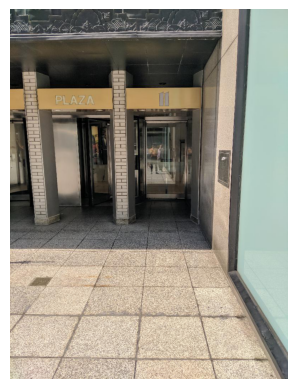

In [7]:
img, labels, path2img = door_train[0]  

plt.imshow(img)
plt.axis('off')  
plt.show()

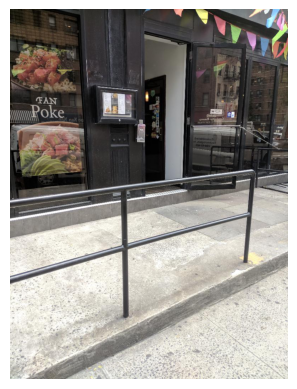

In [8]:
img, labels, path2img = door_val[8]  

plt.imshow(img)
plt.axis('off')  
plt.show()

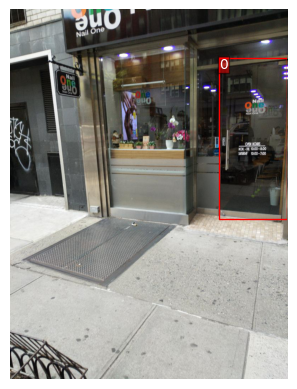

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_image_with_bboxes(img, labels):

    img = np.array(img)
    
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    
    if labels is not None:
        for label in labels:
            class_id, x_center, y_center, width, height = label
            x_min = x_center - width / 2
            y_min = y_center - height / 2

            rect = patches.Rectangle((x_min * img.shape[1], y_min * img.shape[0]), 
                                     width * img.shape[1], height * img.shape[0], 
                                     linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x_min * img.shape[1], y_min * img.shape[0], str(int(class_id)), 
                     color='white', verticalalignment='top', bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 1})
    
    plt.axis('off')
    plt.show()

root_data = "./final_data"
img, labels, path2img = door_train[200]  
plot_image_with_bboxes(img, labels)


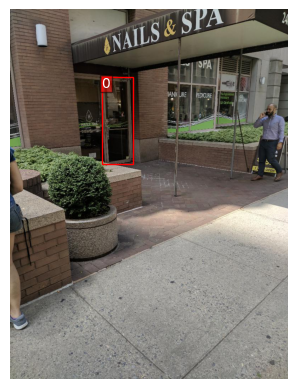

In [10]:
img, labels, path2img = door_train[250]  
plot_image_with_bboxes(img, labels)

In [11]:
#for i in range(len(door_train)):
#    img, labels, path2img  = door_train[i]
#    plot_image_with_bboxes(img, labels)
#    print(i)
#    

Data Aug

In [12]:
import importlib

importlib.invalidate_caches()


In [13]:
from torchvision.transforms.functional import to_pil_image


In [14]:
import random
import numpy as np
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt

def pad_to_square(img, boxes, pad_value=0, normalized_labels=True):
    w, h = img.size
    w_factor, h_factor = (w, h) if normalized_labels else (1, 1)

    dim_diff = np.abs(h - w)
    pad1 = dim_diff // 2
    pad2 = dim_diff - pad1

    if h <= w:
        padding = (0, pad1, 0, pad2)
    else:
        padding = (pad1, 0, pad2, 0)

    img_padded = TF.pad(img, padding=padding, fill=pad_value)
    w_padded, h_padded = img_padded.size

    x1 = w_factor * (boxes[:, 1] - boxes[:, 3] / 2)
    y1 = h_factor * (boxes[:, 2] - boxes[:, 4] / 2)
    x2 = w_factor * (boxes[:, 1] + boxes[:, 3] / 2)
    y2 = h_factor * (boxes[:, 2] + boxes[:, 4] / 2)

    x1 += padding[0]  # left
    y1 += padding[1]  # top
    x2 += padding[2]  # right
    y2 += padding[3]  # bottom

    boxes[:, 1] = ((x1 + x2) / 2) / w_padded
    boxes[:, 2] = ((y1 + y2) / 2) / h_padded
    boxes[:, 3] *= w_factor / w_padded
    boxes[:, 4] *= h_factor / h_padded

    return img_padded, boxes




In [15]:
def hflip(image, labels):
    image = TF.hflip(image)
    labels[:, 1] = 1.0 - labels[:, 1]  
    return image, labels

def vflip(image, labels):
    image = TF.vflip(image)
    labels[:, 2] = 1.0 - labels[:, 2]  
    return image, labels

def adjust_brightness(image, factor):
    return TF.adjust_brightness(image, factor)

def adjust_contrast(image, factor):
    return TF.adjust_contrast(image, factor)

def pad_to_square(image, labels, normalized_labels=True):
    w, h = image.size
    max_side = max(w, h)
    padded_img = Image.new('RGB', (max_side, max_side), (127, 127, 127))
    padded_img.paste(image, ((max_side - w) // 2, (max_side - h) // 2))
    
    if normalized_labels:
        labels[:, 1] = (labels[:, 1] * w + (max_side - w) // 2) / max_side
        labels[:, 2] = (labels[:, 2] * h + (max_side - h) // 2) / max_side
        labels[:, 3] = labels[:, 3] * w / max_side
        labels[:, 4] = labels[:, 4] * h / max_side
    else:
        labels[:, 1] += (max_side - w) // 2
        labels[:, 2] += (max_side - h) // 2

    return padded_img, labels

def resize(image, target_size):
    return TF.resize(image, target_size)



In [16]:

def transformer(image, labels, params):
    if params["pad2square"]:
        image, labels = pad_to_square(image, labels, normalized_labels=params["normalized_labels"])

    image = resize(image, params["target_size"])

    if random.random() < params["p_hflip"]:
        image, labels = hflip(image, labels)

    if random.random() < params["p_vflip"]:
        image, labels = vflip(image, labels)

    if "brightness" in params:
        image = adjust_brightness(image, params["brightness"])

    if "contrast" in params:
        image = adjust_contrast(image, params["contrast"])

    image = TF.to_tensor(image)
    targets = torch.zeros((len(labels), 6))
    targets[:, 1:] = torch.from_numpy(labels)

    return image, targets





image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (1, 5) <class 'numpy.ndarray'>
labels 
 [[0.         0.66346154 0.37644231 0.27820513 0.42019231]]


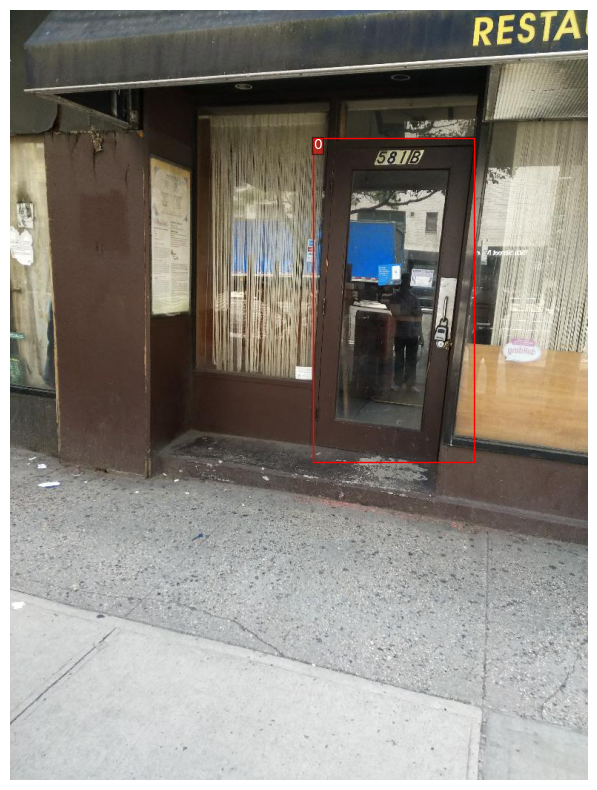

image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (1, 5) <class 'numpy.ndarray'>
labels 
 [[0.         0.55448718 0.46826923 0.2474359  0.45      ]]


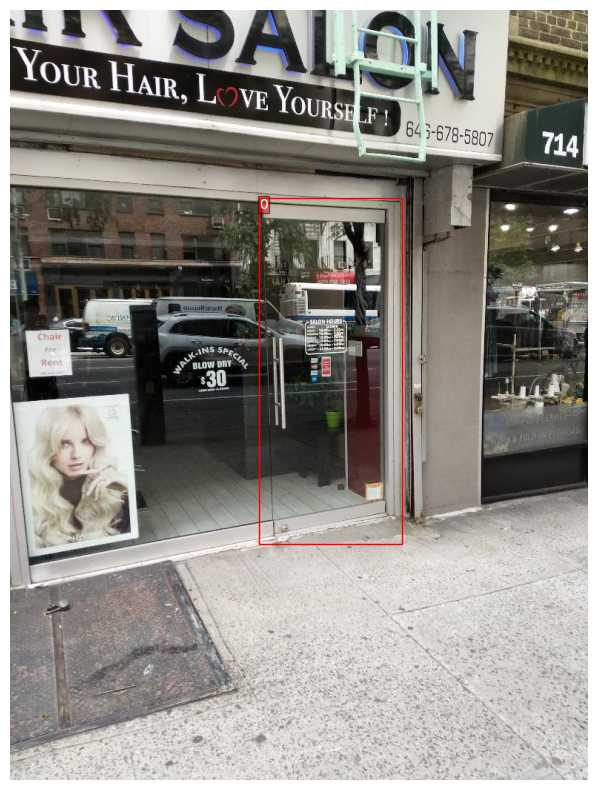

In [17]:
COLORS = np.random.randint(0, 255, size=(80, 3), dtype="uint8")

trans_params_train = {
    "target_size": (416, 416),
    "pad2square": True,
    "p_hflip": 0.5,
    "p_vflip": 0.5,
    "brightness": 0.9,
    "contrast": 0.9,
    "normalized_labels": True,
}


np.random.seed(10)
rnd_ind = np.random.randint(len(door_train))
img, labels, path2img = door_train[rnd_ind] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)

plt.rcParams['figure.figsize'] = (20, 10)
plot_image_with_bboxes(img, labels)

np.random.seed(5)
rnd_ind = np.random.randint(len(door_val))
img, labels, path2img = door_val[rnd_ind] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)

plt.rcParams['figure.figsize'] = (20, 10)
plot_image_with_bboxes(img, labels)



In [18]:
def rescale_bbox(bb, W, H):
    x, y, w, h = bb
    return [x * W, y * H, w * W, h * H]

In [19]:

from PIL import ImageDraw
def show_img_bbox(img, targets, COLORS):
    if torch.is_tensor(img):
        img = TF.to_pil_image(img)
    if torch.is_tensor(targets):
        targets = targets.numpy()[:, 1:]
        
    W, H = img.size
    draw = ImageDraw.Draw(img)
    
    for tg in targets:
        id_ = int(tg[0])
        bbox = tg[1:]
        bbox = rescale_bbox(bbox, W, H)
        xc, yc, w, h = bbox
        
        color = [int(c) for c in COLORS[id_]]
        
        draw.rectangle(((xc - w / 2, yc - h / 2), (xc + w / 2, yc + h / 2)), outline=tuple(color), width=3)
        draw.text((xc - w / 2, yc - h / 2), str(id_),fill=(255, 255, 255, 0))
    
    plt.imshow(np.array(img))        
    plt.axis('off')
    plt.show()

Original image size: (780, 1040) <class 'PIL.Image.Image'>
Original labels shape: (1, 5) <class 'numpy.ndarray'>
Original labels 
 [[0.         0.51794872 0.4875     0.21538462 0.34807692]]
Path to image at index 245: ./final_data/train/images/IMG_20190626_114947.jpg


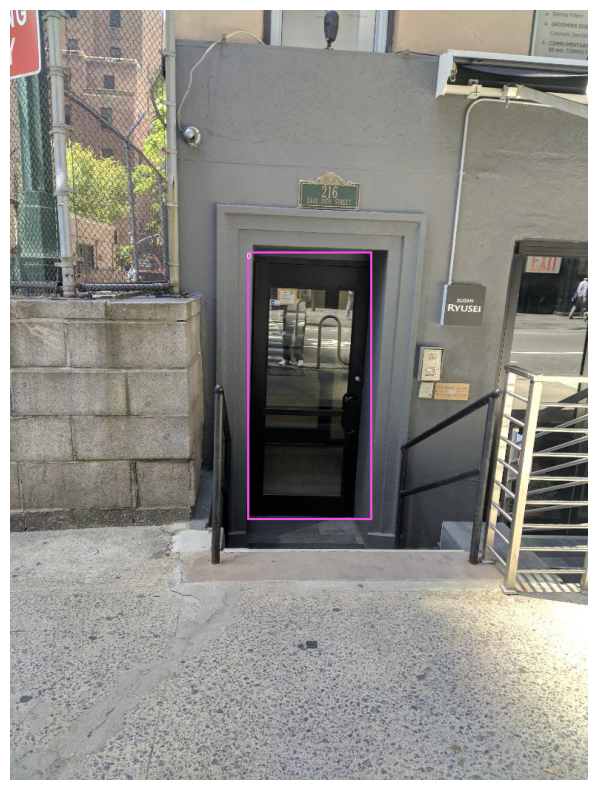

Transformed image size: torch.Size([3, 416, 416]) <class 'torch.Tensor'>
Transformed labels shape: torch.Size([1, 6]) <class 'torch.Tensor'>
Transformed labels 
 tensor([[0.0000, 0.0000, 0.5135, 0.5125, 0.1615, 0.3481]])


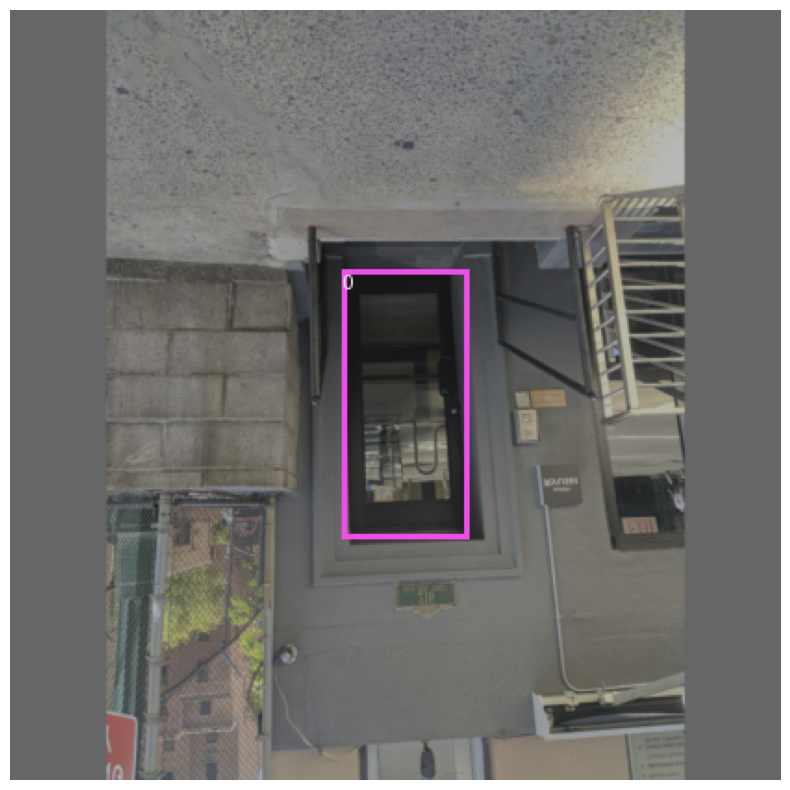

Original image size: (780, 1040) <class 'PIL.Image.Image'>
Original labels shape: (1, 5) <class 'numpy.ndarray'>
Original labels 
 [[0.         0.88269231 0.3875     0.18589744 0.49230769]]
Path to image at index 135: ./final_data/train/images/IMG_20190624_120622.jpg


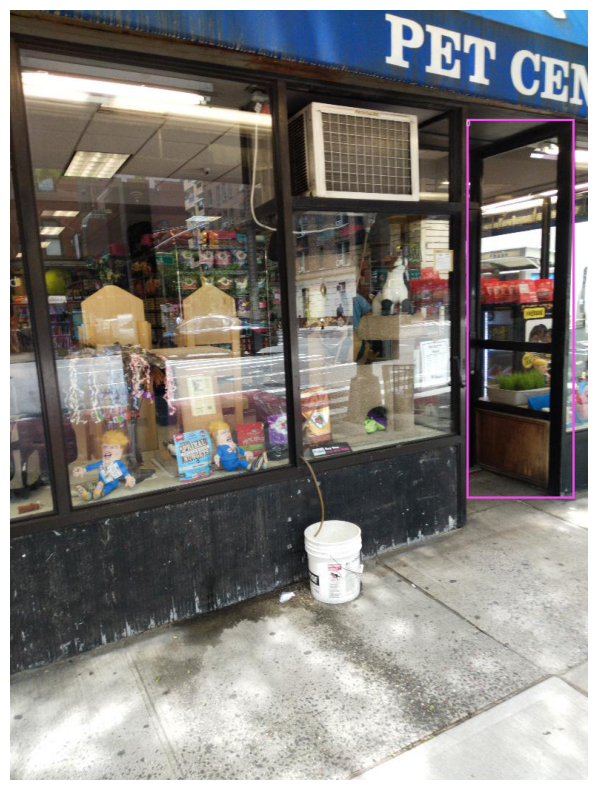

Transformed image size: torch.Size([3, 416, 416]) <class 'torch.Tensor'>
Transformed labels shape: torch.Size([1, 6]) <class 'torch.Tensor'>
Transformed labels 
 tensor([[0.0000, 0.0000, 0.2130, 0.3875, 0.1394, 0.4923]])


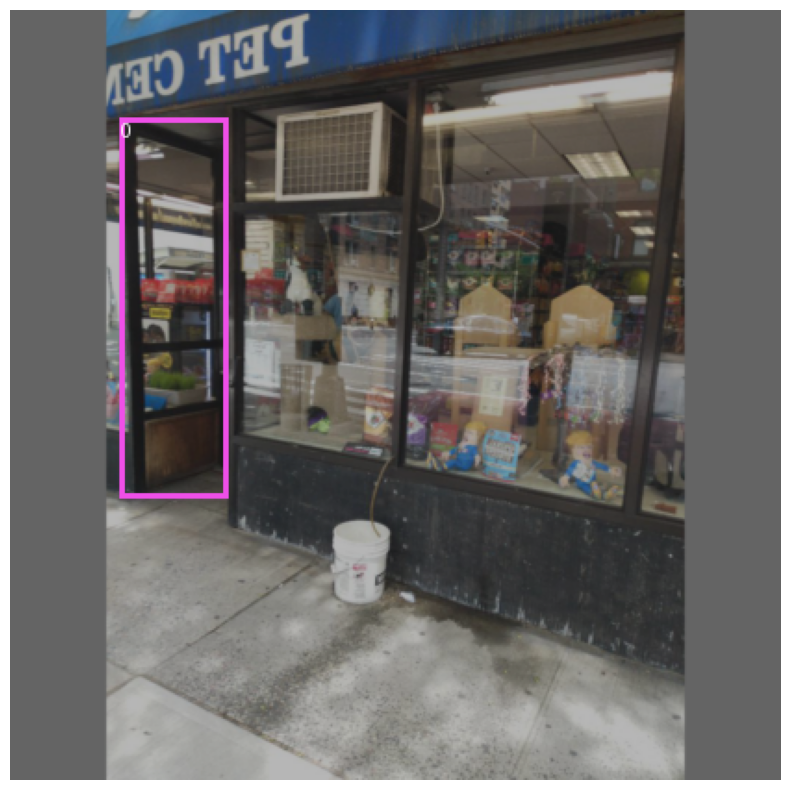

Original image size: (780, 1040) <class 'PIL.Image.Image'>
Original labels shape: (2, 5) <class 'numpy.ndarray'>
Original labels 
 [[0.         0.14615385 0.32019231 0.28717949 0.55192308]
 [0.         0.375      0.33028846 0.23205128 0.5125    ]]
Path to image at index 109: ./final_data/train/images/IMG_20190624_120146.jpg


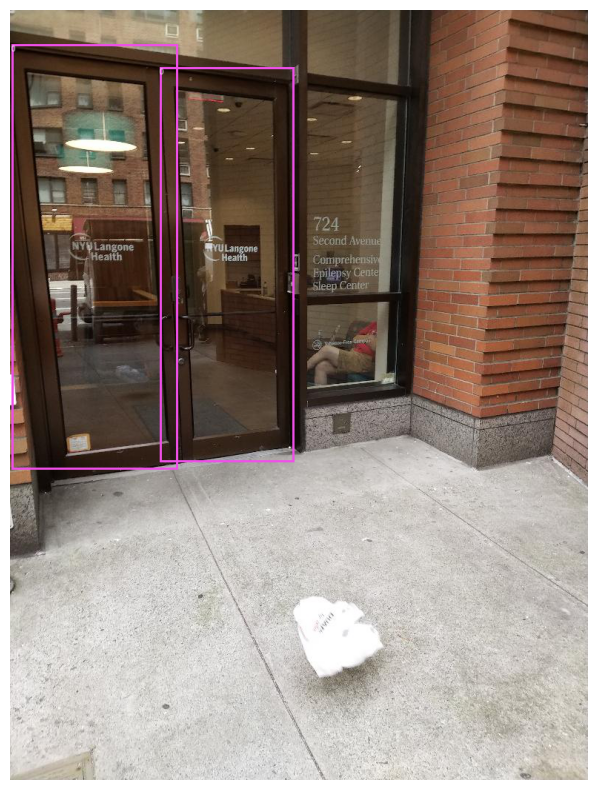

Transformed image size: torch.Size([3, 416, 416]) <class 'torch.Tensor'>
Transformed labels shape: torch.Size([2, 6]) <class 'torch.Tensor'>
Transformed labels 
 tensor([[0.0000, 0.0000, 0.2346, 0.3202, 0.2154, 0.5519],
        [0.0000, 0.0000, 0.4062, 0.3303, 0.1740, 0.5125]])


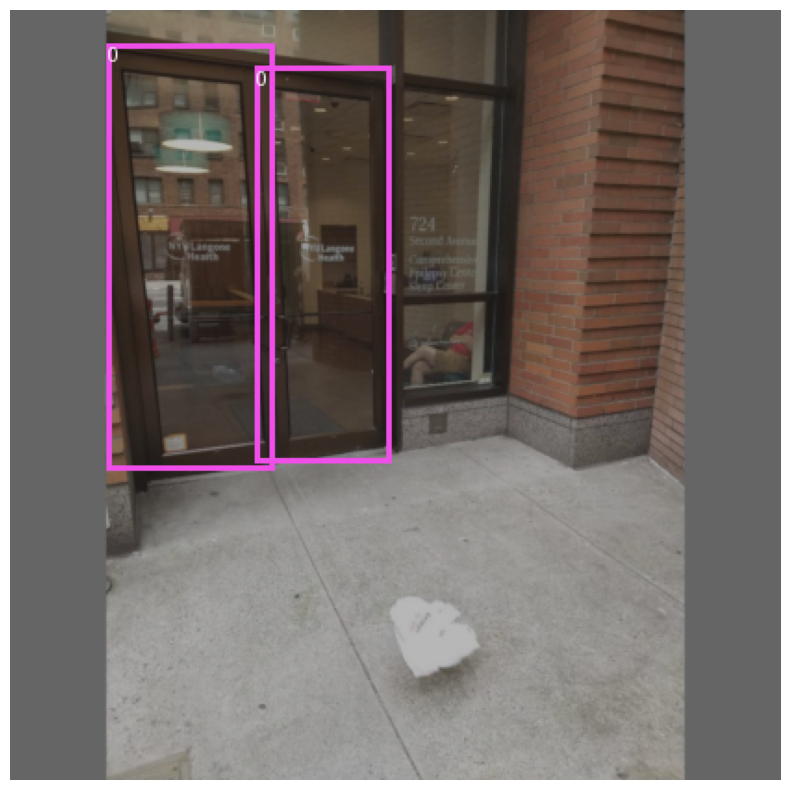

Original image size: (780, 1040) <class 'PIL.Image.Image'>
Original labels shape: (1, 5) <class 'numpy.ndarray'>
Original labels 
 [[0.         0.34679487 0.39471154 0.14487179 0.3125    ]]
Path to image at index 158: ./final_data/train/images/IMG_20190624_115905.jpg


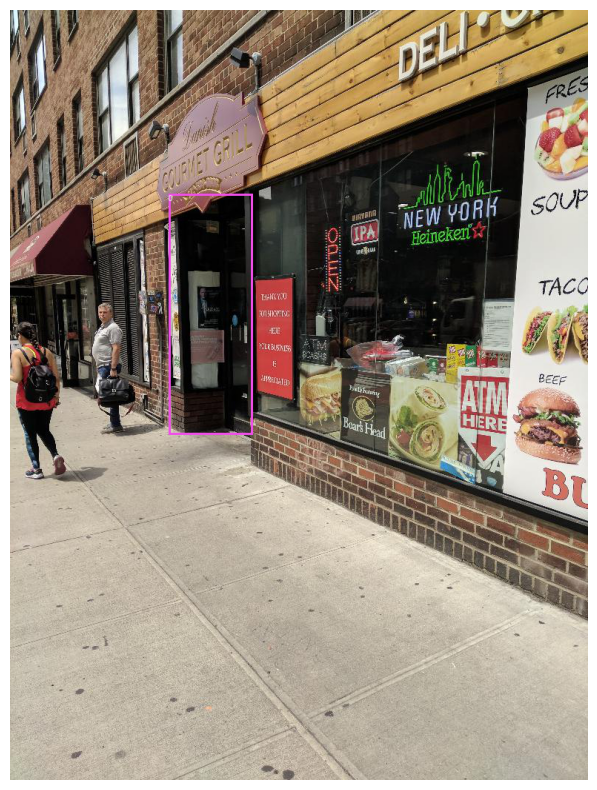

Transformed image size: torch.Size([3, 416, 416]) <class 'torch.Tensor'>
Transformed labels shape: torch.Size([1, 6]) <class 'torch.Tensor'>
Transformed labels 
 tensor([[0.0000, 0.0000, 0.3851, 0.3947, 0.1087, 0.3125]])


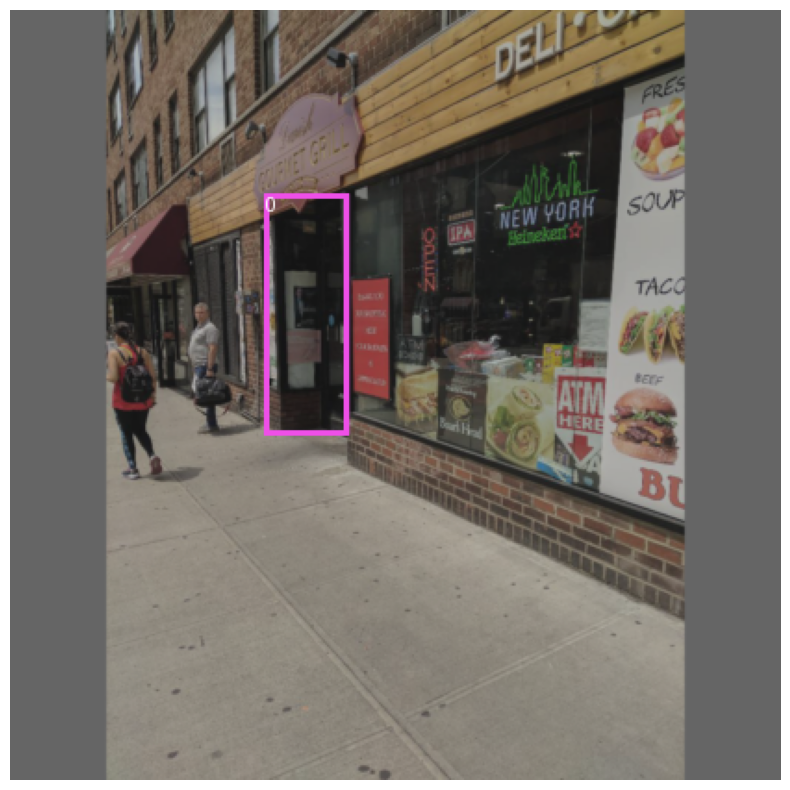

Original image size: (780, 1040) <class 'PIL.Image.Image'>
Original labels shape: (1, 5) <class 'numpy.ndarray'>
Original labels 
 [[0.         0.36346154 0.42980769 0.21153846 0.38461538]]
Path to image at index 190: ./final_data/train/images/IMG_20190624_120614.jpg


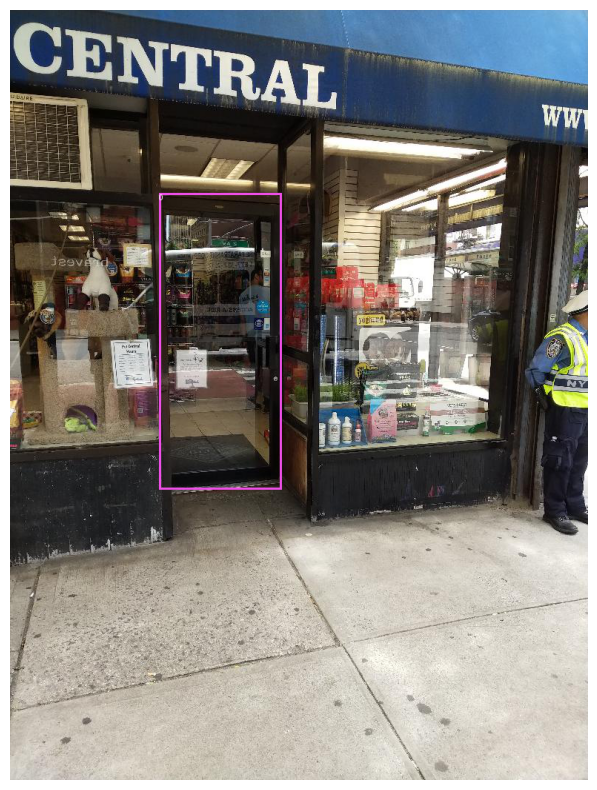

Transformed image size: torch.Size([3, 416, 416]) <class 'torch.Tensor'>
Transformed labels shape: torch.Size([1, 6]) <class 'torch.Tensor'>
Transformed labels 
 tensor([[0.0000, 0.0000, 0.3976, 0.4298, 0.1587, 0.3846]])


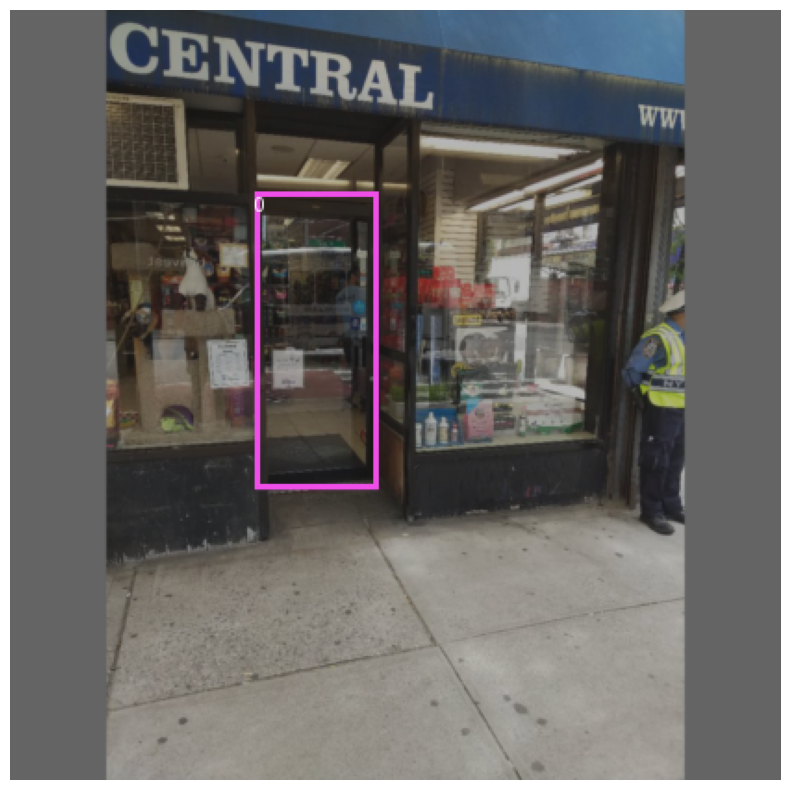

In [20]:


COLORS = np.random.randint(0, 255, size=(80, 3), dtype="uint8")

# Transformation parameters for demonstration
trans_params_demo = {
    "target_size": (416, 416),
    "pad2square": True,
    "p_hflip": 0.5,
    "p_vflip": 0.5,
    "brightness": 0.8,
    "contrast": 0.8,
    "normalized_labels": True,
}

# Function to visualize transformations
def visualize_transformations(dataset, trans_params, num_samples=5):
    plt.rcParams['figure.figsize'] = (20, 10)
    index = random.randint(0, len(door_train) - 1)

    for _ in range(num_samples):
        rnd_ind = np.random.randint(len(dataset))
        img, labels, path2img = dataset[rnd_ind] 
        
        print("Original image size:", img.size, type(img))
        print("Original labels shape:", labels.shape, type(labels))
        print("Original labels \n", labels)
        print(f"Path to image at index {rnd_ind}: {path2img}")

        show_img_bbox(img, labels, COLORS)
        
        img_transformed, labels_transformed = transformer(img, labels, trans_params)
        
        print("Transformed image size:", img_transformed.size(), type(img_transformed))
        print("Transformed labels shape:", labels_transformed.shape, type(labels_transformed))
        print("Transformed labels \n", labels_transformed)
        
        
        show_img_bbox(img_transformed, labels_transformed, COLORS)

visualize_transformations(door_train, trans_params_demo)


In [65]:
import shutil

new_data_dir = "./Augmention_data"
if os.path.exists(new_data_dir):
    shutil.rmtree(new_data_dir)
os.makedirs(new_data_dir, exist_ok=True)
os.makedirs(os.path.join(new_data_dir, "train/images"), exist_ok=True)
os.makedirs(os.path.join(new_data_dir, "train/labels"), exist_ok=True)
os.makedirs(os.path.join(new_data_dir, "val/images"), exist_ok=True)
os.makedirs(os.path.join(new_data_dir, "val/labels"), exist_ok=True)

In [66]:
trans_params_save = {
    "target_size": (416, 416),
    "pad2square": True,
    "p_hflip": 0.5,
    "p_vflip": 0.5,
    "brightness": 0.5,
    "contrast": 0.5,
    "normalized_labels": True,
}
##def save_transformed_data(dataset, split):
##    for i in range(len(dataset)):
##        img, labels, path2img = dataset[i]
##        img_transformed, labels_transformed = transformer(img, labels, trans_params_save)        
##        img.save(os.path.join(new_data_dir, f"{split}/images/original_{i}.jpg"))        
##        img_transformed_pil = TF.to_pil_image(img_transformed)
##        img_transformed_pil.save(os.path.join(new_data_dir, f"{split}/images/transformed_{i}.jpg"))
##
##        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/original_{i}.txt"), labels, fmt="%d %.6f %.6f %.6f %.6f")
##        
##        labels_transformed_numpy = labels_transformed.numpy()
##        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/transformed_{i}.txt"), labels_transformed_numpy[:, 1:], fmt="%d %.6f %.6f %.6f %.6f")
##
##save_transformed_data(door_train, "train")
##save_transformed_data(door_val, "val")
##
##print("Transformed data saved successfully.")

In [67]:

#def save_train_data(dataset, split):
#    for i in range(len(dataset)):
#        img, labels, path2img = dataset[i]
#        img_transformed, labels_transformed = transformer(img, labels, trans_params_save)
#
#        img.save(os.path.join(new_data_dir, f"{split}/images/original_{i}.jpg"))
#
#        img_transformed_pil = TF.to_pil_image(img_transformed)
#        img_transformed_pil.save(os.path.join(new_data_dir, f"{split}/images/transformed_{i}.jpg"))
#
#        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/original_{i}.txt"), labels, fmt="%d %.6f %.6f %.6f %.6f")
#        labels_transformed_numpy = labels_transformed.numpy()
#        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/transformed_{i}.txt"), labels_transformed_numpy[:, 1:], fmt="%d %.6f %.6f %.6f %.6f")

def save_val_data(dataset, split):
    for i in range(len(dataset)):
        img, labels, path2img = dataset[i]

        img.save(os.path.join(new_data_dir, f"{split}/images/original_{i}.jpg"))

        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/original_{i}.txt"), labels, fmt="%d %.6f %.6f %.6f %.6f")


In [68]:
trans_params_save = {
    "target_size": (416, 416),
    "pad2square": True,
    "p_hflip": 0.5,
    "p_vflip": 0.5,
    "brightness": 0.5,
    "contrast": 0.5,
    "normalized_labels": True,
}


def apply_horizontal_flip(image, labels):
    image = TF.hflip(image)
    labels[:, 1] = 1.0 - labels[:, 1]
    return image, labels

def apply_vertical_flip(image, labels):
    image = TF.vflip(image)
    labels[:, 2] = 1.0 - labels[:, 2]  
    return image, labels

def apply_brightness(image, labels, factor):
    image = TF.adjust_brightness(image, factor)
    return image, labels

def apply_contrast(image, labels, factor):
    image = TF.adjust_contrast(image, factor)
    return image, labels

def pad_to_square(image, labels, normalized_labels=True):
    w, h = image.size
    max_side = max(w, h)
    padded_img = Image.new('RGB', (max_side, max_side), (127, 127, 127))
    padded_img.paste(image, ((max_side - w) // 2, (max_side - h) // 2))
    
    if normalized_labels:
        labels[:, 1] = (labels[:, 1] * w + (max_side - w) // 2) / max_side
        labels[:, 2] = (labels[:, 2] * h + (max_side - h) // 2) / max_side
        labels[:, 3] = labels[:, 3] * w / max_side
        labels[:, 4] = labels[:, 4] * h / max_side
    else:
        labels[:, 1] += (max_side - w) // 2
        labels[:, 2] += (max_side - h) // 2

    return padded_img, labels

def resize(image, labels, target_size):
    image = TF.resize(image, target_size)
    return image, labels

def save_transformed_data(dataset, split):
    for i in range(len(dataset)):
        img, labels, path2img = dataset[i]

        img.save(os.path.join(new_data_dir, f"{split}/images/original_{i}.jpg"))
        np.savetxt(os.path.join(new_data_dir, f"{split}/labels/original_{i}.txt"), labels, fmt="%d %.6f %.6f %.6f %.6f")

        if split == "train":
            transformations = [
                apply_horizontal_flip,
                apply_vertical_flip,
                lambda img, labels: apply_brightness(img, labels, np.random.uniform(0.5, 1.5)),
                lambda img, labels: apply_contrast(img, labels, np.random.uniform(0.5, 1.5)),
                lambda img, labels: pad_to_square(img, labels, trans_params_save["normalized_labels"]),
                lambda img, labels: resize(img, labels, trans_params_save["target_size"])
            ]

            num_transformations = min(7, len(transformations))
            chosen_transforms = np.random.choice(transformations, num_transformations, replace=False)

            for j, transform in enumerate(chosen_transforms):
                transformed_img, transformed_labels = transform(img.copy(), labels.copy())
                transformed_img.save(os.path.join(new_data_dir, f"{split}/images/transformed_{i}_{j}.jpg"))
                np.savetxt(os.path.join(new_data_dir, f"{split}/labels/transformed_{i}_{j}.txt"), transformed_labels, fmt="%d %.6f %.6f %.6f %.6f")

save_transformed_data(door_train, "train")
save_val_data(door_val, "val")

print("Transformed data saved successfully.")



Transformed data saved successfully.


In [21]:
root_AUG_data = "./Augmention_data"
Aug_door_train = Door_Data(root_dir=root_AUG_data, subset="train", transform=None)
print("len of train",len(Aug_door_train))
Aug_door_val = Door_Data(root_dir=root_AUG_data, subset="val", transform=None)
print("len of val",len(Aug_door_val))

len of train 1890
len of val 35


In [22]:
img, labels, path2img = Aug_door_train[1000] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)
img, labels, path2img = Aug_door_val[1] 
print("image size:", img.size, type(img))
print("labels shape:", labels.shape, type(labels))
print("labels \n", labels)

image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (2, 5) <class 'numpy.ndarray'>
labels 
 [[0.       0.939744 0.579327 0.117949 0.310577]
 [0.       0.810256 0.573558 0.171795 0.320192]]
image size: (780, 1040) <class 'PIL.Image.Image'>
labels shape: (1, 5) <class 'numpy.ndarray'>
labels 
 [[0.       0.792308 0.33125  0.34359  0.495192]]


Defining Data LoAders

In [50]:
def transformer(image, labels, params):
    if params["pad2square"]:
        image, labels = pad_to_square(image, labels, normalized_labels=params["normalized_labels"])

    image = resize(image, params["target_size"])

    if random.random() < params["p_hflip"]:
        image, labels = hflip(image, labels)

    if random.random() < params["p_vflip"]:
        image, labels = vflip(image, labels)

    if "brightness" in params:
        image = adjust_brightness(image, params["brightness"])

    if "contrast" in params:
        image = adjust_contrast(image, params["contrast"])

    image = TF.to_tensor(image)
    targets = torch.zeros((len(labels), 6))
    targets[:, 1:] = torch.from_numpy(labels)

    return image, targets


In [51]:
import torch
from torch.utils.data import DataLoader
from torchvision.transforms.functional import to_tensor


def collate_fn(batch, target_size=(416, 416)):
    images = []
    targets = []
    paths = []

    for img, labels, path2img in batch:
        # Ensure img is a PIL Image
        if not isinstance(img, Image.Image):
            raise TypeError(f"Expected img to be PIL Image, but got {type(img)}")

        # Ensure labels is a numpy array
        if not isinstance(labels, np.ndarray):
            raise TypeError(f"Expected labels to be numpy array, but got {type(labels)}")

        # Resize image to target size
        img = resize(img, target_size)
        images.append(to_tensor(img))
        targets.append(torch.tensor(labels, dtype=torch.float32))
        paths.append(path2img)
    
    images = torch.stack(images, dim=0)
    
    # Stack all targets into a single tensor
    max_num_labels = max(t.shape[0] for t in targets)
    padded_targets = torch.zeros((len(targets), max_num_labels, targets[0].shape[1]))
    
    for i, t in enumerate(targets):
        padded_targets[i, :t.shape[0], :] = t

    return images, padded_targets, paths




In [52]:
batch_size = 8

train_dl = DataLoader(
    Aug_door_train,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0,
    pin_memory=True,
    collate_fn=collate_fn
)

val_dl = DataLoader(
    Aug_door_val,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0,
    pin_memory=True,
    collate_fn=collate_fn
)

In [53]:
print("train :")
for images, targets, paths in train_dl:
    print("Batch of images type:", type(images))
    print("Batch of images shape:", images.shape)
    print("Batch of targets type:", type(targets))
    print("Batch of targets shape:", targets.shape)
    print("Batch of paths type:", type(paths))
    print("Batch of paths:", paths)
    break
print("val :")
for images, targets, paths in val_dl:
    print("Batch of images type:", type(images))
    print("Batch of images shape:", images.shape)
    print("Batch of targets type:", type(targets))
    print("Batch of targets shape:", targets.shape)
    print("Batch of paths type:", type(paths))
    print("Batch of paths:", paths)
    break

train :
Batch of images type: <class 'torch.Tensor'>
Batch of images shape: torch.Size([8, 3, 416, 416])
Batch of targets type: <class 'torch.Tensor'>
Batch of targets shape: torch.Size([8, 4, 5])
Batch of paths type: <class 'list'>
Batch of paths: ['./Augmention_data/train/images/transformed_121_5.jpg', './Augmention_data/train/images/transformed_93_1.jpg', './Augmention_data/train/images/original_214.jpg', './Augmention_data/train/images/transformed_207_4.jpg', './Augmention_data/train/images/transformed_56_0.jpg', './Augmention_data/train/images/transformed_129_2.jpg', './Augmention_data/train/images/transformed_40_5.jpg', './Augmention_data/train/images/transformed_262_2.jpg']
val :
Batch of images type: <class 'torch.Tensor'>
Batch of images shape: torch.Size([8, 3, 416, 416])
Batch of targets type: <class 'torch.Tensor'>
Batch of targets shape: torch.Size([8, 3, 5])
Batch of paths type: <class 'list'>
Batch of paths: ['./Augmention_data/val/images/original_20.jpg', './Augmention_

In [54]:
print(len(train_dl))
print(len(val_dl))

237
5


In [55]:
print(len(Aug_door_train))
print(len(Aug_door_val))

1890
35


Creating YOLO-v3 Model

In [23]:
import os
import shutil
from PIL import Image
import numpy as np
import torchvision.transforms.functional as TF

def save_yolo_format(dataset, split, output_dir):
    images_dir = os.path.join(output_dir, split, "images")
    labels_dir = os.path.join(output_dir, split, "labels")
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)
    
    for i in range(len(dataset)):
        img, labels, path2img = dataset[i]
        img_name = f"{split}_{i}.jpg"
        label_name = f"{split}_{i}.txt"
        
        img.save(os.path.join(images_dir, img_name))
        np.savetxt(os.path.join(labels_dir, label_name), labels, fmt="%d %.6f %.6f %.6f %.6f")

output_dir = "./yolo_data"
save_yolo_format(Aug_door_train, "train", output_dir)
save_yolo_format(Aug_door_val, "val", output_dir)

In [48]:
!cd yolov5/
!python yolov5/train.py --img 416 --batch 16 --epochs 50 --data door.yaml --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=door.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5/data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-335-g40f490d9 Python-3.12.2 torch-2.3.1 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=

In [36]:
!python yolov5/train.py --img 416 --batch 16 --epochs 50 --data door.yaml --weights yolov5s.pt --device mps

train: weights=yolov5s.pt, cfg=, data=door.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5/data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=mps, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-335-g40f490d9 Python-3.12.2 torch-2.3.1 MPS

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_

In [37]:
import torch

if not torch.backends.mps.is_available():
    print("MPS device not available. Please ensure you're running on a Mac with an M1 chip and have the correct PyTorch version installed.")
else:
    print("MPS device is available.")

MPS device is available.


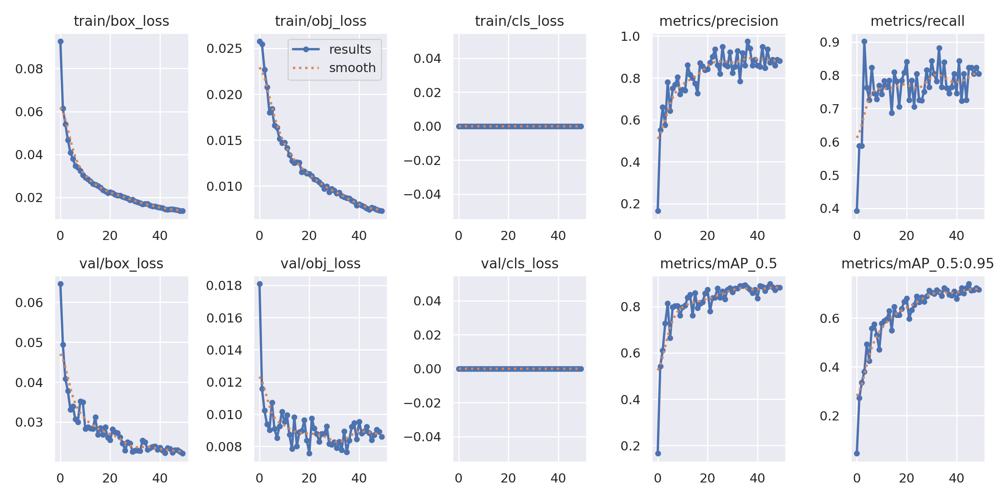

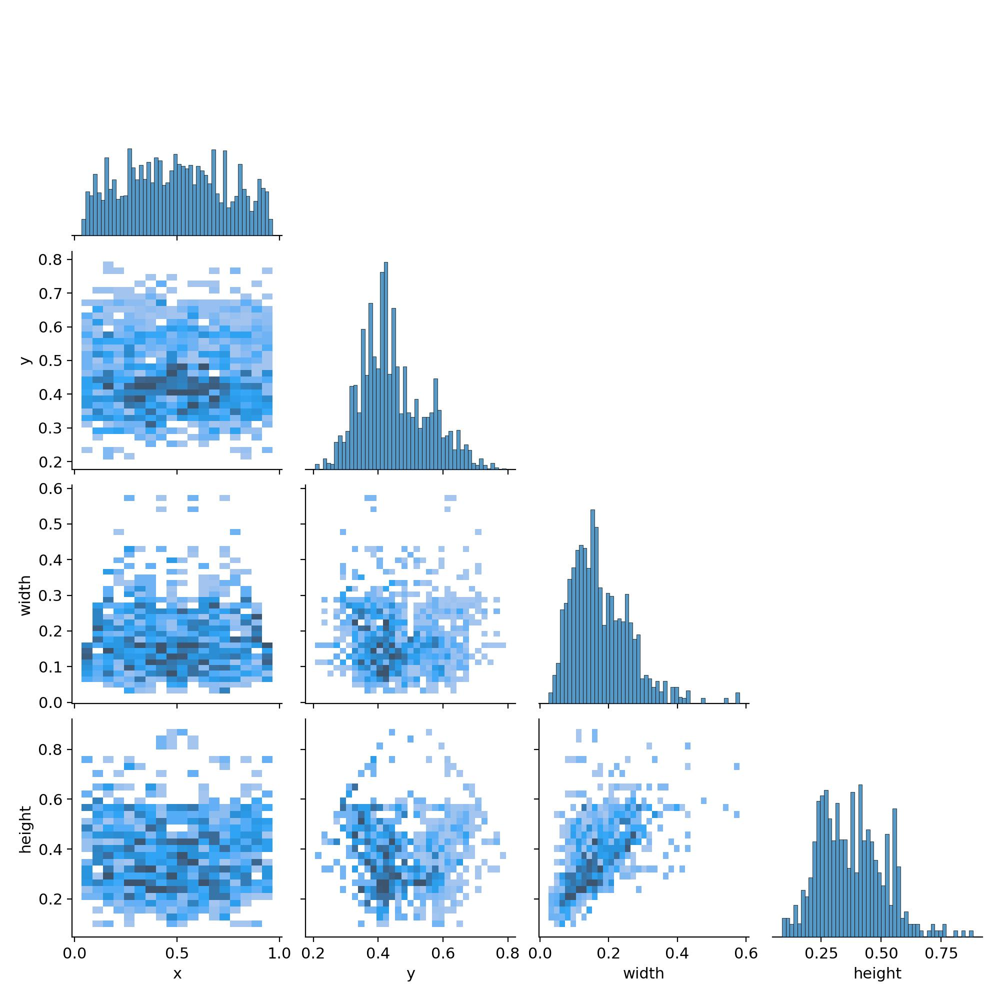

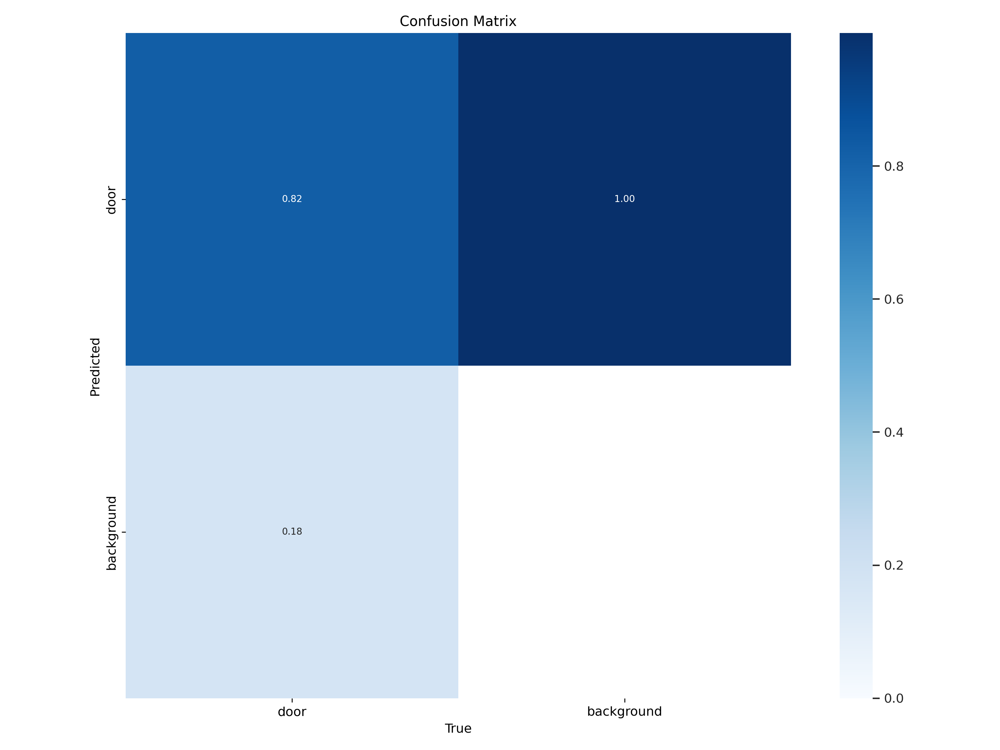

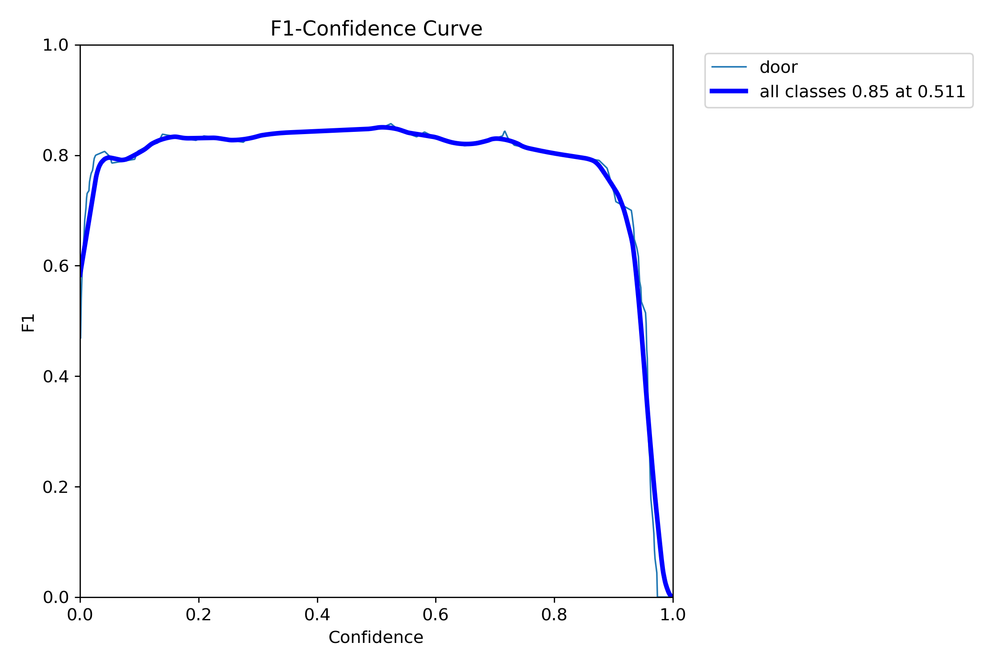

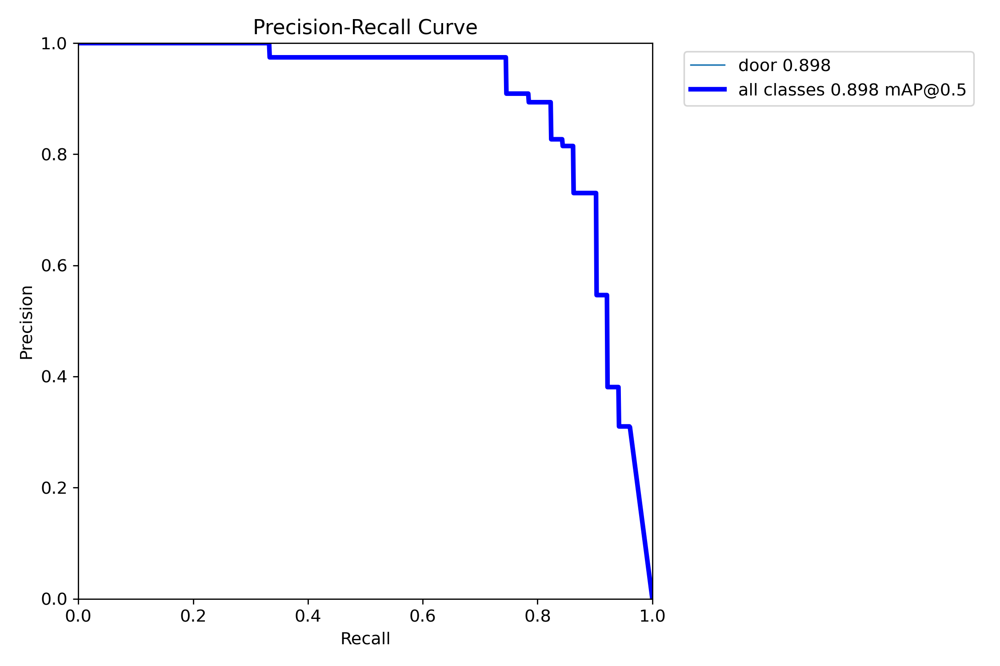

In [2]:
import os
import matplotlib.pyplot as plt
from IPython.display import Image, display

# Define the path to the results directory
results_dir = './exp21'

# Function to display images
def display_image(image_path):
    if os.path.exists(image_path):
        display(Image(filename=image_path))
    else:
        print(f"{image_path} does not exist")

# Display training results
results_files = [
    'results.png',
    'labels_correlogram.jpg',
    'confusion_matrix.png',
    'F1_curve.png',
    'PR_curve.png'
]

for file in results_files:
    display_image(os.path.join(results_dir, file))

In [3]:
weights_dir = os.path.join(results_dir, 'weights')
if os.path.exists(weights_dir):
    print("Contents of weights directory:")
    for file_name in os.listdir(weights_dir):
        print(file_name)
else:
    print("Weights directory does not exist")

Contents of weights directory:
last.pt
best.pt


In [4]:
import torch

model_path = os.path.join(weights_dir, 'best.pt')
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path)

/Users/neginnoori/miniconda3/lib/python3.12/site-packages/torch/hub.py:293: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /Users/neginnoori/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-7-8 Python-3.12.2 torch-2.3.1 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


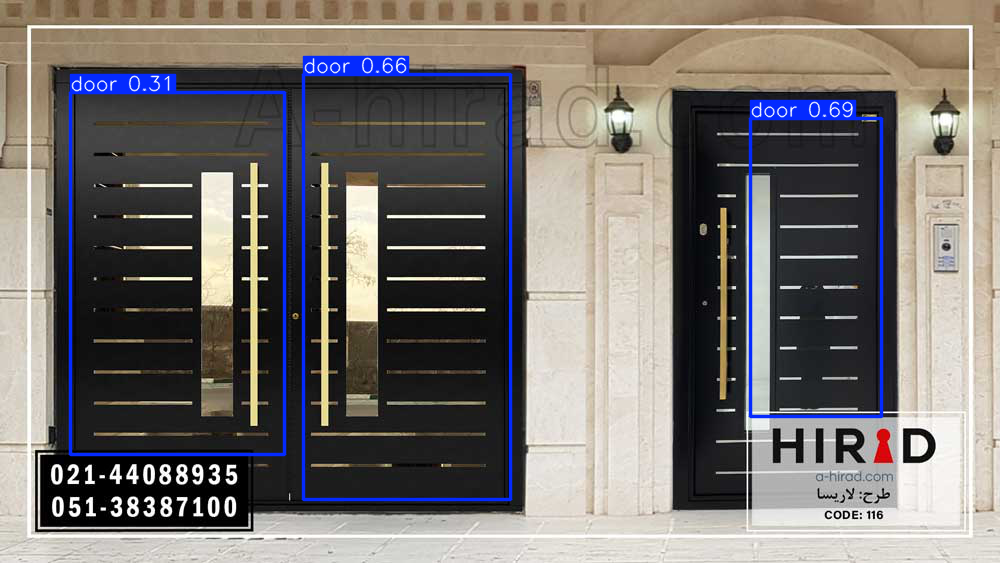

In [10]:
image_path = './door.jpg'
results = model(image_path)
results.show()